# Register microCT volume and histological section
### Extracting ellipse parameters from histological image, align 2D section to 3D stack, register

Following tasks are performed:
- Load and resize histological image
- Compute ellipse parameters in histology
- Match diameters with Z-Height from stack
- Define 3 based on match heights and extract corresponding microCT plane
- Register both planes

In [ ]:

# --- Standard Library ---
import os
import random
import shutil
from pathlib import Path

# --- Scientific & Numerical Libraries ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance
from scipy.spatial.distance import cdist
from scipy.spatial.transform import Rotation as R

# --- Image Processing ---
import cv2
from PIL import Image
import imageio
from tifffile import imwrite

# --- scikit-image ---
from skimage import transform
from skimage.io import imread
from skimage.filters import threshold_otsu
from skimage.measure import regionprops
from skimage.util import compare_images

# --- Medical Imaging / Registration ---
import SimpleITK as sitk

# --- Jupyter Notebook Utilities ---
from IPython.display import clear_output
# %matplotlib inline  # only use inside a notebook

# --- OpenCV font constant ---
font = cv2.FONT_HERSHEY_SIMPLEX

# --- Pandas display settings ---
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


In [ ]:
# Load height and width files and assign them to the cones 
df_height = pd.read_csv("MM_final_regression_data_height.csv")
df_width =  pd.read_csv("MM_final_regression_data_width.csv")

cone_0 = df_height[df_width["Cone"] == "cone_0"]["height_Predicted"].tolist()
cone_1 = df_height[df_height["Cone"] == "cone_1"]["height_Predicted"].tolist()
cone_2 = df_width[df_width["Cone"] == "cone_2"]["width_Predicted"].tolist()

In [ ]:
#Check values
for w0, h1, w2 in zip(cone_0, cone_1, cone_2):
    print(f"{w0}\t{h1}\t{w2}")

2.868576159802032	2.9508587916646327	2.9317757206415838
2.8676301943172007	2.9499162365639	2.9308404696692505
2.8666842288323697	2.9489736814631664	2.929905218696918
2.865738263347539	2.9480311263624333	2.9289699677245853
2.864792297862708	2.9470885712617005	2.928034716752253
2.863846332377877	2.9461460161609674	2.92709946577992
2.862900366893045	2.9452034610602342	2.926164214807588
2.8619544014082146	2.944260905959501	2.9252289638352558
2.861008435923384	2.943318350858768	2.9242937128629225
2.8600624704385527	2.9423757957580348	2.92335846189059
2.8591165049537217	2.9414332406573016	2.9224232109182573
2.8581705394688908	2.9404906855565685	2.921487959945925
2.85722457398406	2.9395481304558357	2.9205527089735925
2.856278608499229	2.9386055753551026	2.91961745800126
2.855332643014398	2.937663020254369	2.9186822070289278
2.854386677529567	2.9367204651536363	2.9177469560565945
2.853440712044736	2.935777910052903	2.916811705084262
2.852494746559905	2.93483535495217	2.9158764541119293
2.85154

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (158759754 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


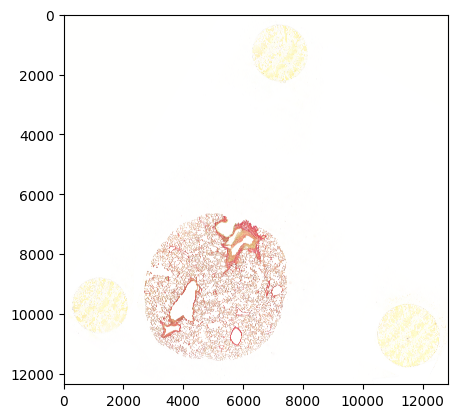

In [ ]:
# Load histological image 

try:
    hist_im
except NameError:
 
    hist_im = imread("/pn_local/2_1/Microscopy/2_1_5/2_1_5_aligned_ps.png")


plt.imshow(hist_im)
file_name = "2_1_5"

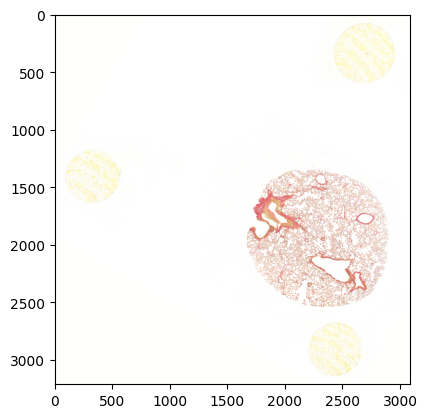

In [ ]:
# Scale down and manually align, so that cones are in similar position to microCT stack
scale_factor = 4
rotated_image = cv2.rotate(hist_im, cv2.ROTATE_90_COUNTERCLOCKWISE)

#flipped_image = cv2.flip(rotated_image, 0) 
#rotated_image_2= rotate(flipped_image ,angle=-25, cval=255,reshape=False)
h, w = rotated_image.shape[:2]
#resized_image = rotated_image_2
resized_image = cv2.resize(rotated_image  , (w // scale_factor, h // scale_factor), interpolation=cv2.INTER_AREA)

plt.imshow(resized_image )

In [ ]:
# Define resolutions 

hist_scale = 0.00116
ct_scale = 0.0039

(14.557097434997559, 15.26761245727539)
(13.468700408935547, 14.159846305847168)
(13.392611503601074, 15.88187026977539)
(13.468700408935547, 14.159846305847168)
(461.48724365234375, 475.9353332519531)
Cone 0: Center: (2427.12744140625, 2914.55810546875), Width: 461.48724365234375, Height: 475.9353332519531, Angle: 170.49508666992188
Relative Center: (0.79, 0.91)
Assigned cone label 2.0 to ellipse 0
(2.309401035308838, 4.0)
(2.1213202476501465, 3.0)
(2.1213202476501465, 3.0)
(3.162355899810791, 3.1624984741210938)
(7.2889604568481445, 12.760143280029297)
(2.309401035308838, 4.0)
(2.1213202476501465, 3.0)
(8.347676277160645, 17.8644962310791)
(7.053247451782227, 9.107934951782227)
(4.769696235656738, 5.507570743560791)
(2.5, 5.0)
(7.653153896331787, 8.777654647827148)
(3.3112521171569824, 6.907140254974365)
(3.1234424114227295, 5.924339294433594)
(3.924283266067505, 6.204836845397949)
(2.1213202476501465, 3.0)
(5.830738067626953, 9.003780364990234)
(4.914969444274902, 15.295172691345215

/tmp/ipykernel_4529/850003083.py:89: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  cones_df = pd.concat([cones_df, new_row], ignore_index=True)


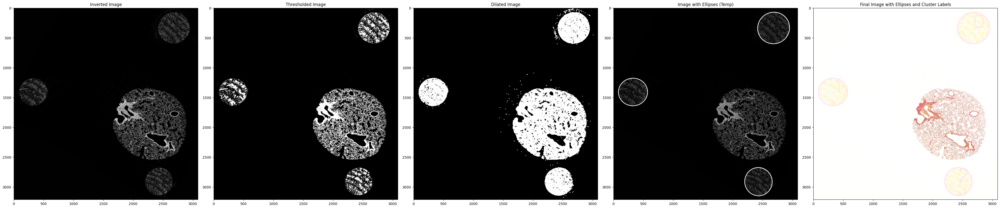

  cone_id       width
0       2  461.487244
1       1  463.920959
2       0  527.505981


In [ ]:
# Extract ellipse parameters 

hist_centers = []
# Assuming resized_image is a BGR image
cluster_means = pd.read_csv("cluster_means.csv")

# Extract image width and height
h, w = resized_image.shape[:2]

# Create an empty DataFrame to store cone_id and width
cones_df = pd.DataFrame(columns=["cone_id", "width"])

# Assuming resized_image is a BGR image
resized_image_r = resized_image[:, :, 2]  # Extracting the Red channel
idx_cones = 0

# Invert the image (255 - pixel values)
resized_image_r_inverted = np.invert(resized_image_r)

# Make copies for manipulation
im_temp = np.copy(resized_image_r_inverted)  # Using the inverted image here
dis_im = np.copy(resized_image)

# Threshold the image (adjust the threshold if needed)
ret, thresh1 = cv2.threshold(resized_image_r_inverted, 30, 255, cv2.THRESH_BINARY)

# Dilation step to expand the white areas
kernel = np.ones((10, 10), np.uint8)  # Create a 5x5 kernel for dilation
dilated_image = cv2.dilate(thresh1, kernel, iterations=1)  # Apply dilation

# Find contours in the dilated image
contours, _ = cv2.findContours(dilated_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Loop over each contour
for i, contour in enumerate(contours):
    if len(contour) < 5:
        continue  # Skip small contours
    
    # Fit an ellipse to the contour
    ((centx, centy), (width, height), angle) = cv2.fitEllipseDirect(contour)
    
    # Filtering condition based on width and height
    min_width = 250  # Minimum width of the ellipse
    max_width = 800  # Maximum width of the ellipse
    min_height = 250  # Minimum height of the ellipse
    max_height = 800  # Maximum height of the ellipse
    print((width, height))
    # Filter based on width and height
    if min_width <= width <= max_width and min_height <= height <= max_height:
        # If ellipse passes the filtering, draw it
        dis_im = cv2.ellipse(dis_im, (int(centx), int(centy)), (int(width / 2), int(height / 2)), angle, 0, 360, (255, 0, 255), 10)
        im_temp = cv2.ellipse(im_temp, (int(centx), int(centy)), (int(width / 2), int(height / 2)), angle, 0, 360, (255, 0, 255), 10)
        hist_centers.append([centx,centy])
        # Calculate relative centers
        relative_centx = centx / w  # Relative x center
        relative_centy = centy / h  # Relative y center
        print(f"Cone {idx_cones}: Center: ({centx}, {centy}), Width: {width}, Height: {height}, Angle: {angle}")
        print(f"Relative Center: ({relative_centx:.2f}, {relative_centy:.2f})")
        
        # Calculate the Euclidean distance between the relative center and the cluster centers
        cluster_centers = cluster_means[["x_center", "y_center"]].values  # Extract the x_center and y_center columns
        relative_center = np.array([relative_centx, relative_centy]).reshape(1, -1)  # Reshape the relative center

        # Compute the distance between the relative center and each cluster center
        distances = cdist(relative_center, cluster_centers, metric="euclidean")
        
        # Get the index of the closest cluster (the one with the smallest distance)
        closest_cluster_idx = np.argmin(distances)
        cluster_label = cluster_means.iloc[closest_cluster_idx]["cluster_label"]
        
        # Assign the cluster label to the cone
        print(f"Assigned cone label {cluster_label} to ellipse {idx_cones}")
        
        # Add the cluster label as text on the image
        text = f"{str(int(cluster_label))}"
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 10
        color = (255, 0, 255)  # Pink color for text
        thickness = 2
        
        # Positioning the text at the center of the ellipse
        cv2.putText(dis_im, text, (int(centx - 10), int(centy - 10)), font, font_scale, color, thickness)
        
        # Use pd.concat to append the row to the DataFrame
        new_row = pd.DataFrame({"cone_id": [int(cluster_label)], "width": [width]})
        cones_df = pd.concat([cones_df, new_row], ignore_index=True)
        
        # Increment the cone index
        idx_cones += 1

# Plot the images in the correct order
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(40, 40))

# Plot the inverted image (after extraction)
axes[0].imshow(resized_image_r_inverted, cmap="gray")
axes[0].set_title("Inverted Image")

# Plot the original thresholded image
axes[1].imshow(thresh1, cmap="gray")
axes[1].set_title("Thresholded Image")

# Plot the dilated image
axes[2].imshow(dilated_image, cmap="gray")
axes[2].set_title("Dilated Image")

# Plot the temporary image with ellipses drawn
axes[3].imshow(im_temp, cmap="gray")
axes[3].set_title("Image with Ellipses (Temp)")

# Plot the final image with ellipses drawn and cluster labels
axes[4].imshow(dis_im, cmap="gray")
axes[4].set_title("Final Image with Ellipses and Cluster Labels")

plt.tight_layout()
plt.show()

# Save the DataFrame to a CSV file
cones_df.to_csv("MM_cones_data.csv", index=False)

# Print the DataFrame to check the saved data
print(cones_df)


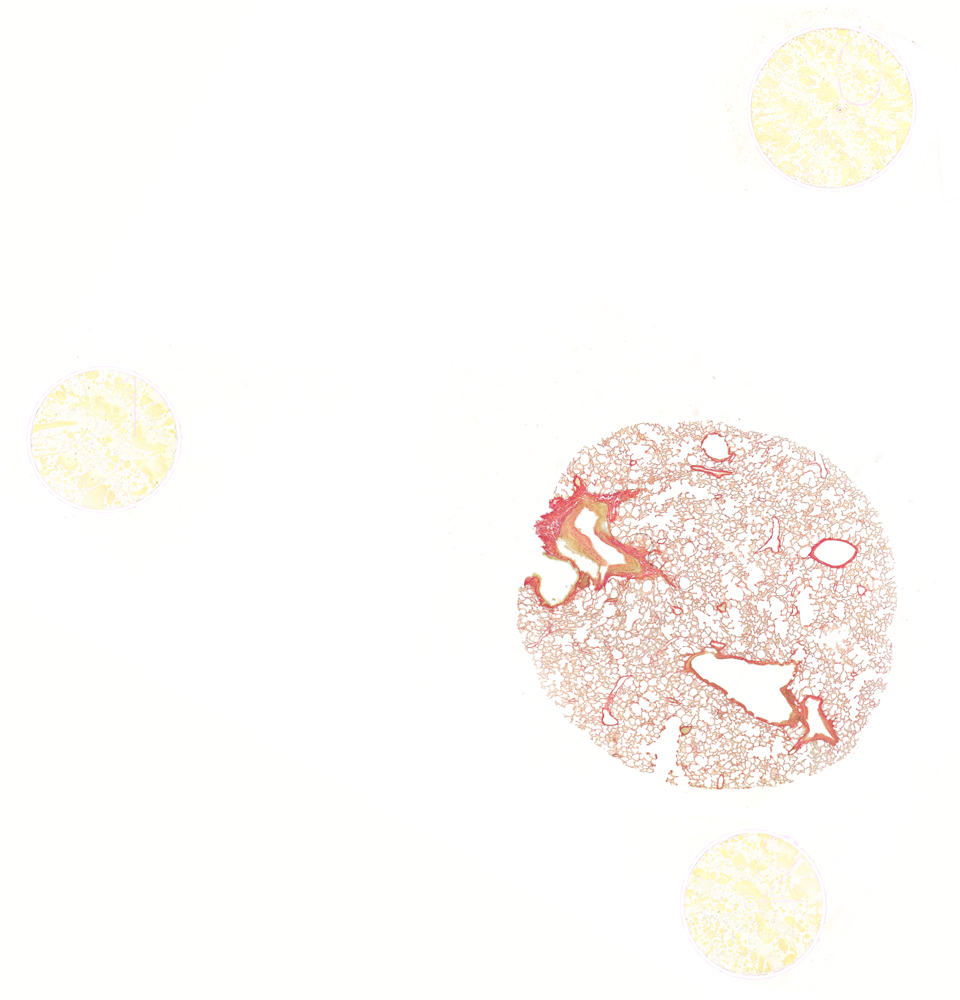

In [ ]:
#Check in larger image

plt.figure(figsize=(40, 40))  
plt.imshow(dis_im)             
plt.axis('off')               
plt.show()

In [ ]:
# Convert to mm 

cones_df = cones_df.sort_values(by=cones_df.columns[0], ascending=True)
# Multiply the last column ('width') by the factor
cones_df[cones_df.columns[-1]] =  (cones_df[cones_df.columns[-1]] * hist_scale)*scale_factor

# Print the updated DataFrame
print(cones_df)


  cone_id     width
2       0  2.447628
1       1  2.152593
0       2  2.141301


In [ ]:
# Match diameter in histological image with layer in z stack
cone_0_pos = np.argmin(abs(cones_df.iloc[0, -1] - np.array(cone_0)))
print(cone_0_pos,cone_0[cone_0_pos] )

cone_1_pos = np.argmin(abs(cones_df.iloc[1, -1] - np.array(cone_1)))
print(cone_1_pos,cone_1[cone_1_pos] )

cone_2_pos = np.argmin(abs(cones_df.iloc[2, -1] - np.array(cone_2)))
print(cone_2_pos,cone_2[cone_2_pos] )

445 2.447621519052245
847 2.152514621343691
845 2.141488649020565


In [ ]:
# Load Stack 
try:
    im_list
except NameError:
    import numpy as np
    im_list = np.load('MM_im_list_full.npy')

4794 5170
Center 0: [3344.245762491135, 2321.047005151455]
Center 1: [296.782722567389, 2303.8971788037124]
Center 2: [1751.5784904383281, 4944.478755750004]


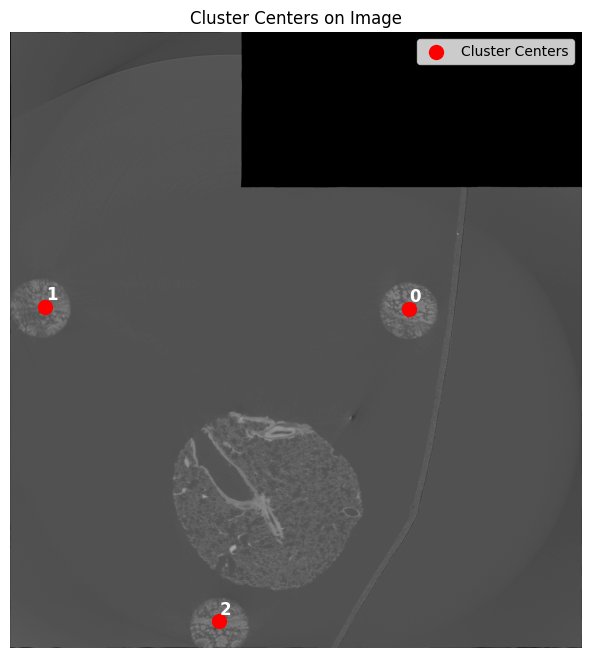

In [ ]:
# Check if center are correctly positioned 

im_h,im_w = im_list[1000].shape
print(im_w,im_h)


# Convert relative cluster centers (assumed to be in [0, 1]) to absolute pixel positions
center_0_ct = [cluster_centers[0][0] * im_w, cluster_centers[0][1] * im_h]
center_1_ct = [cluster_centers[1][0] * im_w, cluster_centers[1][1] * im_h]
center_2_ct = [cluster_centers[2][0] * im_w, cluster_centers[2][1] * im_h]

print("Center 0:", center_0_ct)
print("Center 1:", center_1_ct)
print("Center 2:", center_2_ct)

# Plot the image and overlay the cluster centers
plt.figure(figsize=(8, 8))
plt.imshow(im_list[1000], cmap='gray')  # Use cmap='gray' if it's a grayscale image
plt.scatter([center_0_ct[0], center_1_ct[0], center_2_ct[0]],
            [center_0_ct[1], center_1_ct[1], center_2_ct[1]],
            color='red', s=100, label='Cluster Centers')

# Annotiere die Punkte mit den entsprechenden Nummern
for i, (x, y) in enumerate([center_0_ct, center_1_ct, center_2_ct]):
    plt.annotate(f'{i}', (x, y), textcoords="offset points", xytext=(5, 5), ha='center', color='white', fontsize=12, fontweight='bold')
    
plt.legend()
plt.title("Cluster Centers on Image")
plt.axis('off')
plt.show()

In [ ]:
# Convert defined points based on histological image into array

search_point11 = np.array([center_0_ct[0],center_0_ct[1],cone_0_pos])
search_point21 = np.array([center_1_ct[0],center_1_ct[1],cone_1_pos])
search_point31 = np.array([center_2_ct[0],center_2_ct[1],cone_2_pos])

In [17]:
print(search_point11,search_point21,search_point31)

[3344.24576249 2321.04700515  445.        ] [ 296.78272257 2303.8971788   847.        ] [1751.57849044 4944.47875575  845.        ]


1983 5170 4794
[1797.5356585  3189.80764657  712.33333333]


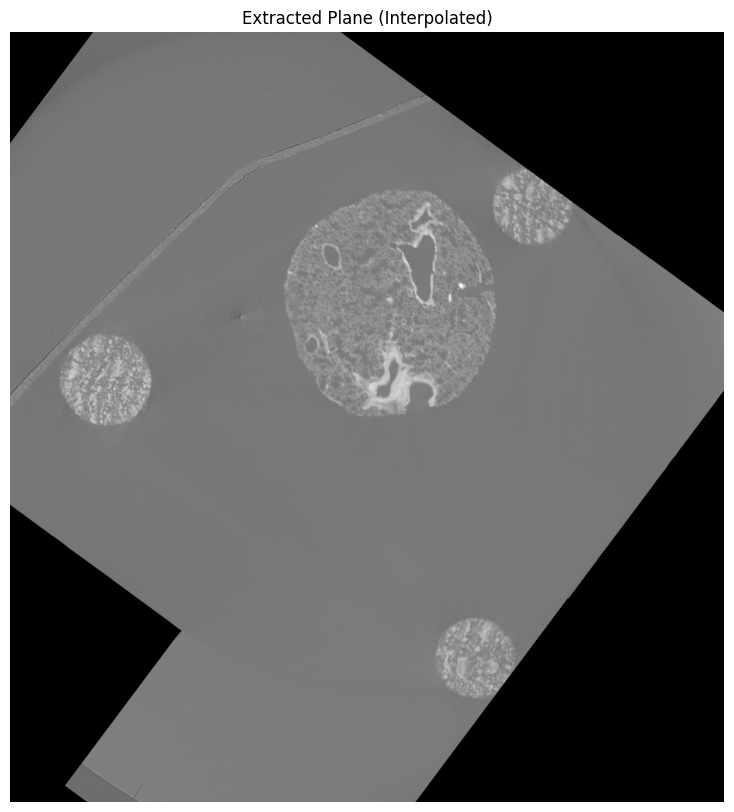

In [ ]:
# Extract Plane from volume #

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import map_coordinates

def translation_candidate(diff, center, im_list, coordinate_system, padding_value=0):
    """
    Extract a 2D slice from a 3D volume by translating a plane along its normal
    and resampling using trilinear interpolation.
    
    Parameters:
        diff (float): Distance to translate along the normal vector
        center (ndarray): 3x1 center point of the plane
        im_list (ndarray): 3D volume (shape: depth x height x width)
        coordinate_system (ndarray): 3x3 local coordinate system (from SVD)
    
    Returns:
        I (ndarray): Extracted 2D slice
        center_new (ndarray): New center after translation
    """
   
    #im_list = np.array(im_list, dtype=np.float32)/255  # Ensure NumPy array
    depth, im_h, im_w = im_list.shape
    print(depth, im_h, im_w )
    
    cp = [im_w // 2, im_h // 2, 0]

    # Translate center along normal vector
    center_new = (center.T + coordinate_system[:, 2] * diff).flatten()
    print(center_new)
    # Create grid of pixel coordinates
    y_grid, x_grid = np.meshgrid(np.arange(im_h), np.arange(im_w), indexing='ij')
    pixel_coords = np.stack([x_grid - cp[0], y_grid - cp[1], np.zeros_like(x_grid)], axis=-1)  # shape: (H, W, 3)

    # Project 2D pixel coordinates into 3D space
    projected = np.tensordot(pixel_coords, coordinate_system.T, axes=1) + center_new  # Now works!

    # Reorder to match map_coordinates (order: z, y, x)
    coords = [
        projected[..., 2].ravel(),  # z
        projected[..., 1].ravel(),  # y
        projected[..., 0].ravel()   # x
    ]

    # Interpolate values from the 3D volume
    I_flat = map_coordinates(im_list, coords, order=1, mode='constant', cval=0)
    I = I_flat.reshape((im_h, im_w))
    #I = np.clip(I, 0, 1)
    # Optional post-processing
    #I = np.flip(I, axis=1)  # Flip horizontally to match original
    #I = np.clip(I, 0, 1)

    return I, center_new






# Stack matched points and compute SVD
points = np.array([search_point11, search_point21, search_point31]).T
center = np.mean(points, axis=1, keepdims=True)
svd = np.linalg.svd(points - center)
coordinate_system = svd[0]  # 3x3 matrix

# Extract the plane
Inormal, center_normal = translation_candidate(0, center, im_list, coordinate_system)

# Show it
plt.figure(figsize=(10, 10))
plt.imshow(Inormal, cmap="gray") 
plt.title("Extracted Plane (Interpolated)")
plt.axis("off")
plt.show()

In [ ]:
# Get translation and rotation parameters for rendering in arivis 

def print_plane_pose(coordinate_system, center_new, voxel_spacing):
    """
    Print translation (µm) and rotation (degrees) for Arivis Volume Fusion.
    Assumes volume and matrices are in (x,y,z) order.
    """
    # --- Translation in µm ---
    translation_um = center_new * voxel_spacing  # (x,y,z)

    # --- Rotation in degrees (roll, pitch, yaw) ---
    rot = R.from_matrix(coordinate_system)
    euler_deg = rot.as_euler('xyz', degrees=True)

    print("=== Plane Pose for Arivis ===")
    print(f"Translation (µm): X={translation_um[0]:.3f}, "
          f"Y={translation_um[1]:.3f}, Z={translation_um[2]:.3f}")
    print(f"Rotation (deg):   Roll(X)={euler_deg[0]:.3f}, "
          f"Pitch(Y)={euler_deg[1]:.3f}, Yaw(Z)={euler_deg[2]:.3f}")
    print("============================")

# Example usage
voxel_spacing = np.array([ct_scale*1000, ct_scale*1000, ct_scale*1000])  # µm per voxel
print_plane_pose(coordinate_system, center_normal, voxel_spacing)


=== Plane Pose for Arivis ===
Translation (µm): X=7010.389, Y=12440.250, Z=2778.100
Rotation (deg):   Roll(X)=1.188, Pitch(Y)=-8.488, Yaw(Z)=143.400


0.0039 0.00116
3.362068965517241
12351 12854
(5163, 5207, 4)
(5170, 4794)


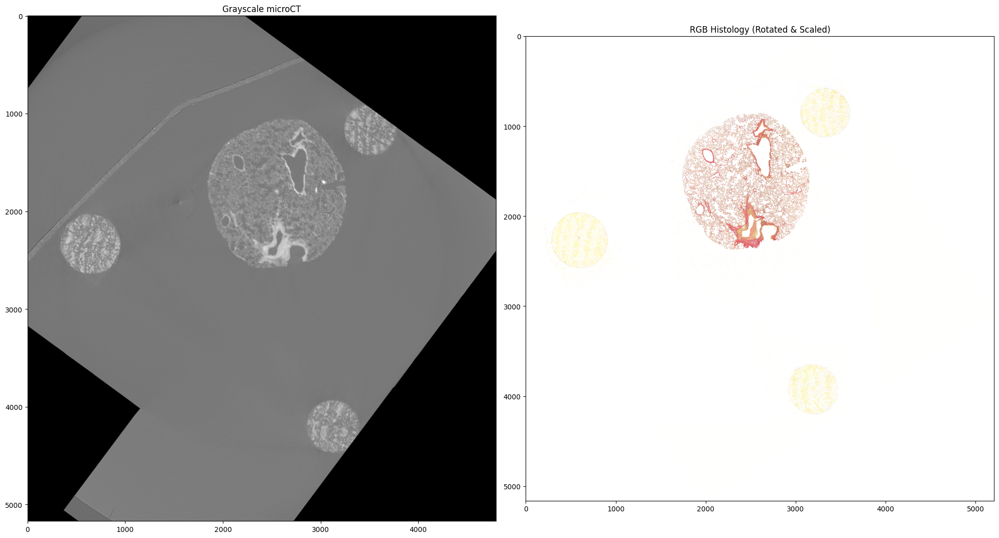

In [ ]:
# Preliminary alignment for registration

# Rotate the histology image first
rotated_image1 = cv2.rotate(hist_im,  cv2.ROTATE_90_COUNTERCLOCKWISE)
rotated_image1 = cv2.rotate(rotated_image1,  cv2.ROTATE_90_COUNTERCLOCKWISE)
hist_rot =33
# Calculate scale factor
scale_factor = ct_scale/hist_scale
print( ct_scale,hist_scale)
print(scale_factor)
# Resize (shrink) the **rotated** image
height, width = rotated_image1 .shape[:2]
print(height, width)
new_size = (int(width / scale_factor), int(height/ scale_factor))
histology_scaled = cv2.resize(rotated_image1 , new_size)
histology_scaled= rotate(histology_scaled,angle=hist_rot, cval=255)
print(histology_scaled .shape)
print(Inormal.shape)
# Plot both images
plt.figure(figsize=(20, 20))

# Grayscale microCT
plt.subplot(1, 2, 1)
plt.imshow(Inormal, cmap='gray')
plt.title("Grayscale microCT")


# Scaled and rotated RGB histology image
plt.subplot(1, 2, 2)
plt.imshow(histology_scaled)
plt.title("RGB Histology (Rotated & Scaled)")


plt.tight_layout()
plt.show()
#plt.imsave("output_manual.png",Inormal, cmap = "grey")
plt.imsave("scaled_histo_2_1_5.png", histology_scaled)

In [ ]:
# Export image 
array_min, array_max = Inormal.min(), Inormal.max()
normalized = ((Inormal - array_min) / (array_max - array_min) * 255).astype(np.uint8)

img = Image.fromarray(normalized, mode='L')
#img.save(file_name+"_Algo_3D2D_TransformedCT.png")

In [22]:
### Function to plot the current status of the registration ###
### The following code snippits were obtained from the following link and edited ###
### https://insightsoftwareconsortium.github.io/SimpleITK-Notebooks/Python_html/60_Registration_Introduction.html ###

%matplotlib inline

# Callback invoked by the interact IPython method for scrolling through the image stacks of
# the two images (moving and fixed).
def display_images(fixed_image_z, moving_image_z, fixed_npa, moving_npa):
    # Create a figure with two subplots and the specified size.
    plt.subplots(1,2,figsize=(10,8))
    
    # Draw the fixed image in the first subplot.
    plt.subplot(1,2,1)
    plt.imshow(fixed_npa[fixed_image_z,:,:],cmap=plt.cm.Greys_r);
    plt.title('fixed image')
    plt.axis('off')
    
    # Draw the moving image in the second subplot.
    plt.subplot(1,2,2)
    plt.imshow(moving_npa[moving_image_z,:,:],cmap=plt.cm.Greys_r);
    plt.title('moving image')
    plt.axis('off')
    
    plt.show()

# Callback invoked by the IPython interact method for scrolling and modifying the alpha blending
# of an image stack of two images that occupy the same physical space. 
def display_images_with_alpha(image_z, alpha, fixed, moving):
    img = (1.0 - alpha)*fixed[:,:,image_z] + alpha*moving[:,:,image_z] 
    plt.imshow(sitk.GetArrayViewFromImage(img),cmap=plt.cm.Greys_r);
    plt.axis('off')
    plt.show()
    
# Callback invoked when the StartEvent happens, sets up our new data.
def start_plot():
    global metric_values, multires_iterations
    
    metric_values = []
    multires_iterations = []

# Callback invoked when the EndEvent happens, do cleanup of data and figure.
def end_plot():
    global metric_values, multires_iterations
    
    del metric_values
    del multires_iterations
    # Close figure, we don't want to get a duplicate of the plot latter on.
    plt.close()

# Callback invoked when the IterationEvent happens, update our data and display new figure.
def plot_values(registration_method):
    global metric_values, multires_iterations
    
    metric_values.append(registration_method.GetMetricValue())                                       
    # Clear the output area (wait=True, to reduce flickering), and plot current data
    clear_output(wait=True)
    # Plot the similarity metric values
    plt.plot(metric_values, 'r')
    plt.plot(multires_iterations, [metric_values[index] for index in multires_iterations], 'b*')
    plt.xlabel('Iteration Number',fontsize=12)
    plt.ylabel('Metric Value',fontsize=12)
    plt.show()
    
# Callback invoked when the sitkMultiResolutionIterationEvent happens, update the index into the 
# metric_values list. 
def update_multires_iterations():
    global metric_values, multires_iterations
    multires_iterations.append(len(metric_values))

In [ ]:
# Prepare histology for registration 
# Binary image used 
mov_hist = histology_scaled[:,:,2] > 230
print(np.min(mov_hist), np.max(mov_hist))
mov_hist = mov_hist.astype(int)*255
mov_hist = 255 - mov_hist
print(np.min(mov_hist), np.max(mov_hist))

False True
0 255


0 255
0 255


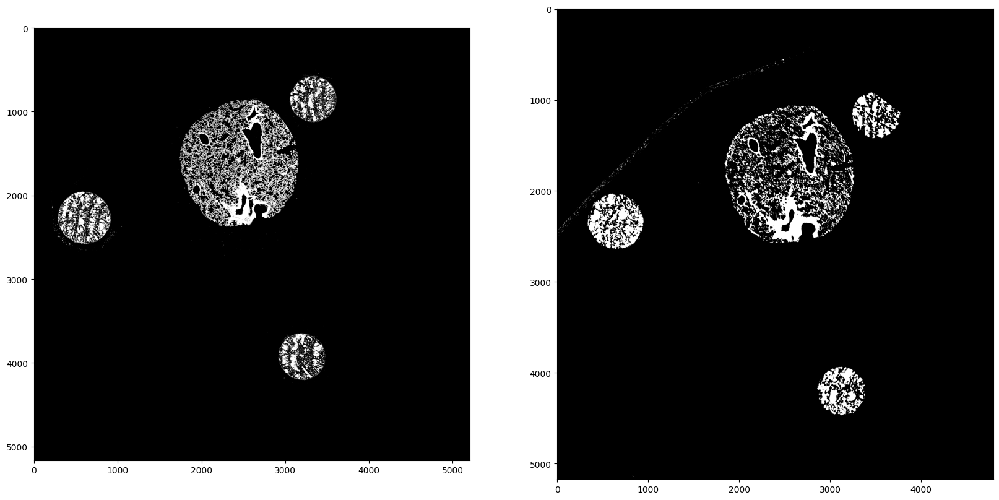

In [ ]:
# Prepare for SimpleITK 

fix_ct = Inormal > 74
fix_ct = fix_ct.astype(int)*255

### set Input Images ###

moving_image = sitk.GetImageFromArray(mov_hist .astype(int))
fixed_image = sitk.GetImageFromArray(fix_ct.astype(int))
npa_zslice1 = sitk.GetArrayViewFromImage(moving_image)
npa_zslice2 = sitk.GetArrayViewFromImage(fixed_image)



f, ax = plt.subplots(1,2, figsize = (20,20))
ax[0].imshow(npa_zslice1, cmap= "grey")
ax[1].imshow(npa_zslice2, cmap= "grey")
print(np.min(npa_zslice1), np.max(npa_zslice1))
print(np.min(npa_zslice2), np.max(npa_zslice2))


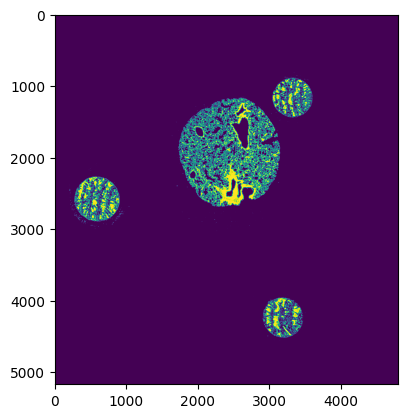

In [25]:
### Set inital transformation parameters ###
### The following code snippits were obtained from the following link and edited ###
### https://simpleitk.org/doxygen/latest/html/classitk_1_1simple_1_1AffineTransform.html#a35bd79dc81f6d81ae8a22d8664b36898 ###


initialTransform = sitk.Euler2DTransform()
#initialTransform.Scale(round(ct_scale/hist_scale))
#initialTransform.Scale(13)
initial_transform = initialTransform
initial_transform = sitk.CenteredTransformInitializer(fixed_image, 
                                                      moving_image, 
                                                      initialTransform, sitk.CenteredTransformInitializerFilter.MOMENTS
                                                      )

# Creat stik image for initial transforma
moving_resampled = sitk.Resample(moving_image, fixed_image,initial_transform, sitk.sitkLinear, 0.0, moving_image.GetPixelID())



npa_zslice = sitk.GetArrayViewFromImage(moving_resampled)
plt.imshow(npa_zslice)

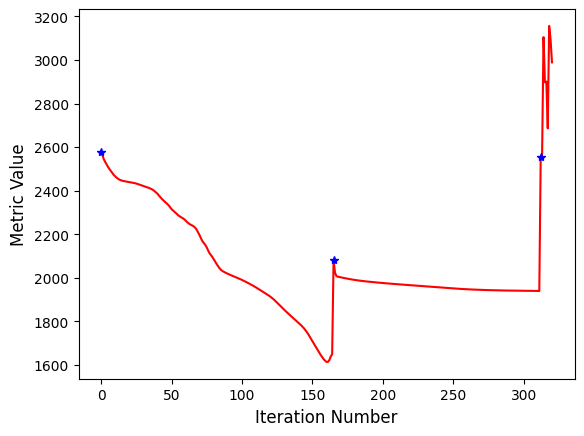

In [26]:
### Perform Registration ###
### The following code snippits were obtained from the following link and edited ###
### https://insightsoftwareconsortium.github.io/SimpleITK-Notebooks/Python_html/60_Registration_Introduction.html ###

registration_method = sitk.ImageRegistrationMethod()

# Similarity metric settings.
registration_method.SetMetricAsMeanSquares()
#This value has been changed on my private my machine
registration_method.SetMetricSamplingPercentage(1)
registration_method.SetOptimizerScales
registration_method.SetInterpolator(sitk.sitkLinear)

# Optimizer settings.
registration_method.SetOptimizerAsGradientDescent(learningRate=2,numberOfIterations=1500 )



# Setup for the multi-resolution framework.            
registration_method.SetOptimizerScalesFromPhysicalShift() 
registration_method.SetInitialTransform(initial_transform, inPlace=True)
registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas = [2,1,0])
registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()
# Don't optimize in-place, we wo0d possibly like to run this cell multiple times.

# Connect all of the observers so that we can perform plotting during registration.
registration_method.AddCommand(sitk.sitkStartEvent, start_plot)
registration_method.AddCommand(sitk.sitkEndEvent, end_plot)
registration_method.AddCommand(sitk.sitkMultiResolutionIterationEvent, update_multires_iterations) 
registration_method.AddCommand(sitk.sitkIterationEvent, lambda: plot_values(registration_method))

final_transform = registration_method.Execute(sitk.Cast(fixed_image,sitk.sitkFloat32), sitk.Cast(moving_image,sitk.sitkFloat32))



In [ ]:
# Resample transformed image  for Export 

# moving_resampled1 = sitk.Resample(moving_image, fixed_image, final_transform, sitk.sitkLinear, 0.0, moving_image.GetPixelID())
# npa_zslice = sitk.GetArrayViewFromImage(moving_resampled1)
# plt.imshow(npa_zslice)



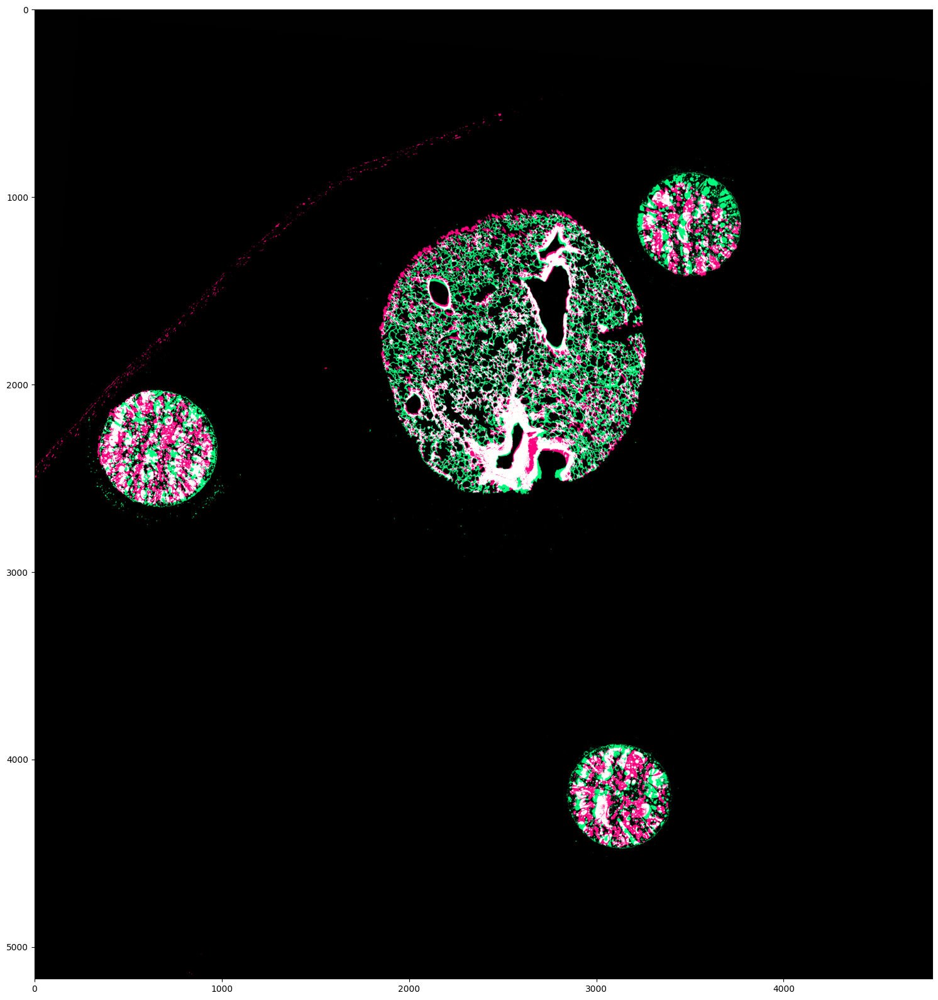

In [28]:


### Overlay the resampled and ground truth image ###

resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(fixed_image)
resampler.SetInterpolator(sitk.sitkLinear)
resampler.SetDefaultPixelValue(1)
resampler.SetTransform(final_transform)
out = resampler.Execute(moving_image)
simg1 = sitk.Cast(sitk.RescaleIntensity(fixed_image), \
                  sitk.sitkUInt8)
simg2 = sitk.Cast(sitk.RescaleIntensity(out), sitk.sitkUInt8)
cimg = sitk.Compose(simg1, simg2, simg1//2.+simg2//2.)

npa_zslice1 = sitk.GetArrayViewFromImage(simg1)
npa_zslice2 = sitk.GetArrayViewFromImage(simg2)
npa_zslice3 = sitk.GetArrayViewFromImage(cimg)

f, ax = plt.subplots(1,1, figsize = (20,20))

ax.imshow(npa_zslice3)



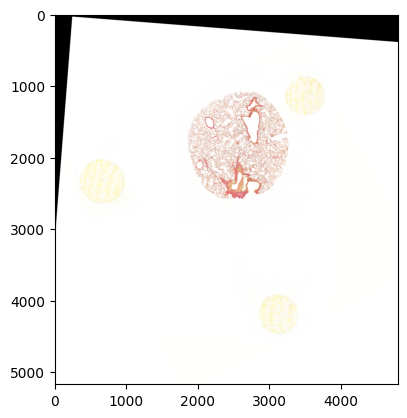

In [ ]:
# Transform RGB Image

### Create an RGB transformed image ###
width, height,_ = npa_zslice3.shape
output_size = [height, width]
# Get Scaling and resize 

#resized = cv2.resize(histology_scaled ,(height,widht))
#resized = rotate(resized,angle = hist_rot)
resized = histology_scaled
#Resample image with transformation on each channel
org_image = sitk.GetImageFromArray(resized[:,:,0])
resampled = sitk.Resample(org_image,output_size, final_transform)
npa_zslice = sitk.GetArrayViewFromImage(resampled )
npa_slicer = np.copy(npa_zslice)

org_imageg = sitk.GetImageFromArray(resized[:,:,1])
resampled = sitk.Resample(org_imageg,output_size, final_transform)
npa_zsliceg = sitk.GetArrayViewFromImage(resampled )
npa_sliceg = np.copy(npa_zsliceg)

org_imageb = sitk.GetImageFromArray(resized[:,:,2])
resampled = sitk.Resample(org_imageb,output_size, final_transform)
npa_zsliceb = sitk.GetArrayViewFromImage(resampled )
npa_sliceb = np.copy(npa_zsliceb)

#Create imges for each array in unint8
imr=Image.fromarray(np.uint8(npa_slicer) , 'L') 
imb=Image.fromarray(np.uint8(npa_sliceb) , 'L')
img=Image.fromarray(np.uint8(npa_sliceg) , 'L')

# merge
merged=Image.merge("RGB",(imr,img,imb))

plt.imshow(merged)



(5170, 4794, 3)
(5170, 4794)


[]

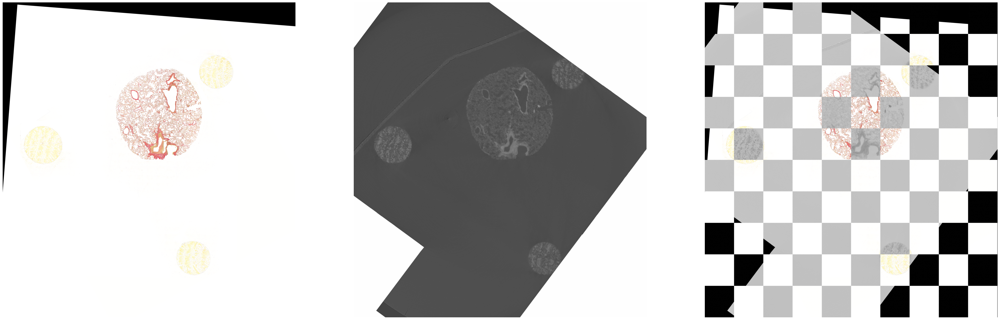

In [ ]:
# Create a checker Board image of the ct scan and the histo image 

def checkerboard(img1,img2,n_tiles=(10,10)):
    comp_img = compare_images(img1, img2, method='checkerboard',n_tiles=n_tiles)
    return comp_img

A =  np.asarray(merged)
print(A.shape)
#A =   A-130
# Invert image so the background is white 
B = 1-Inormal
#B = B-130
print(B.shape)
C0=checkerboard(A[:,:,0],B[:,:])
C1=checkerboard(A[:,:,1],B[:,:])
C2=checkerboard(A[:,:,2],B[:,:])
C =np.stack([C0,C1,C2],axis=2)
fig = plt.figure(figsize=(48, 28))
ax=plt.subplot(131)
ax.imshow(A)
ax.axis('off')
ax=plt.subplot(132)
ax.imshow(B, cmap="Greys")
ax.axis('off')
ax=plt.subplot(133)
ax.imshow(C)
ax.axis('off')



plt.plot()

